# Zillow Housing Price

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from bokeh.charts import TimeSeries, Histogram, Scatter, BoxPlot, output_file, Bar, show
from bokeh.io import output_notebook, push_notebook
from bokeh.layouts import row
import bokeh.resources
output_notebook(resources=bokeh.resources.INLINE)
%matplotlib inline

Loading BokehJS ...

In [2]:
os.chdir(r"F:\backup\practice\kaggle\Zillow\WIP")
prop_df=pd.read_csv('properties_2016.csv')

C:\Users\rags\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2723: DtypeWarning: Columns (22,32,34,49,55) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Cleanse and merge the datasets

In [3]:
nullval = prop_df.isnull().sum()
nullval=100 - (nullval/prop_df['parcelid'].count())*100
p=Bar(nullval,legend=False,title="Available data for each column")#,xscale='linear',yscale='categorical')
show(p)

In [4]:
# Remove the columns with less than 50% data availability
# Fill the missing records by median statistic

for k,v in nullval.items():
    if nullval[k] < 50.0:
        prop_df=prop_df.drop([k],axis=1)    

prop_df=prop_df.drop(['propertycountylandusecode'],axis=1)
prop_df=prop_df.drop(['propertyzoningdesc'],axis=1)
final_df=prop_df.fillna(prop_df.median())
del prop_df

In [5]:
train_data=pd.read_csv('train_2016_v2.csv')
pd.to_datetime(train_data['transactiondate'])
# Merge the final dataframe with training dataframe

final_df=final_df.merge(train_data,on='parcelid',how='left')
duplicate_parcelids = final_df.set_index('parcelid').index.get_duplicates()

Notes <font color='red'>
* There are some parcelids which are repeated in the properties dataset.
* Total count of unique parcelid's are 1000k+ but total record count in the dataset is 2900k+.
* But the number of parcelid's repeated may give insights on the price trend.****
</font>

## Start with some plotting

In [6]:
visual_df=final_df[pd.notnull(final_df['logerror'])]

In [7]:
# Convert logerror to absolute logerror

visual_df['logerror']=abs(visual_df['logerror'])
p=Scatter(visual_df,x='taxamount',y='logerror')
show(p)

C:\Users\rags\Anaconda3\lib\site-packages\ipykernel\__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [154]:
p=Scatter(visual_df,x='latitude',y='longitude',color='logerror',legend=True)
show(p)

In [16]:
test_set.dtypes

bathroomcnt                     float64
bedroomcnt                      float64
buildingqualitytypeid           float64
calculatedbathnbr               float64
calculatedfinishedsquarefeet    float64
finishedsquarefeet12            float64
fips                            float64
fullbathcnt                     float64
heatingorsystemtypeid           float64
latitude                        float64
longitude                       float64
lotsizesquarefeet               float64
propertylandusetypeid           float64
rawcensustractandblock          float64
regionidcity                    float64
regionidcounty                  float64
regionidzip                     float64
roomcnt                         float64
unitcnt                         float64
yearbuilt                       float64
structuretaxvaluedollarcnt      float64
taxvaluedollarcnt               float64
landtaxvaluedollarcnt           float64
taxamount                       float64
censustractandblock             float64


In [10]:
p=Scatter(visual_df,x='bedroomcnt',y='taxamount',color='logerror',legend=False)
show(p)

In [13]:
p=Scatter(visual_df,x='transactiondate',y='logerror')
show(p)

In [8]:
visual_df.dtypes
visual_df=visual_df.drop(['assessmentyear','transactiondate','parcelid'],axis=1)
#visual_df=visual_df.drop(['buildingqualitytypeid','regionidzip'],axis=1)

## Do some model building

In [10]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression, SelectKBest
from sklearn.metrics import r2_score
x=visual_df.ix[:,visual_df.columns != 'logerror']
y=visual_df['logerror']

In [12]:
# Select features
best=SelectKBest(f_regression,k=10).fit(x,y)
ids=best.get_support(indices=True)
X_new=pd.DataFrame(x[ids])

In [13]:
reg=LinearRegression()
reg.fit(X_new,y)
pred=reg.predict(X_new)
r2_score(y,pred)

0.0019436058779263021

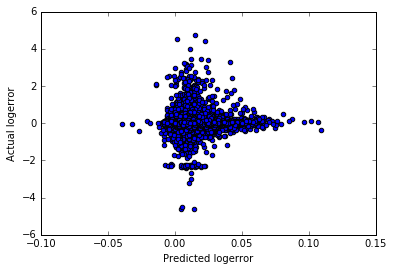

In [14]:
plt.scatter(x=pred,y=y)
plt.xlabel('Predicted logerror')
plt.ylabel('Actual logerror')
plt.show()

Looks like the logerror predicted is less compared to actual logerror

### Forecast data

In [17]:
test_set=final_df
test_set=test_set.drop(['assessmentyear','transactiondate','parcelid','logerror'],axis=1)

In [20]:
# Predict on the testset
xtest=pd.DataFrame(test_set[ids])
predt=reg.predict(xtest)

In [33]:
# Save result to file
res=pd.DataFrame(final_df['parcelid'])
res.parcelid=res.parcelid.astype(int)
res['201610']=pd.Series(list(predt),index=res.index)
res['201611']=pd.Series(list(predt),index=res.index)
res['201612']=pd.Series(list(predt),index=res.index)
res['201710']=pd.Series(list(predt),index=res.index)
res['201711']=pd.Series(list(predt),index=res.index)
res['201712']=pd.Series(list(predt),index=res.index)
res.to_csv('linear_model.csv',index=False,float_format='%.4f')

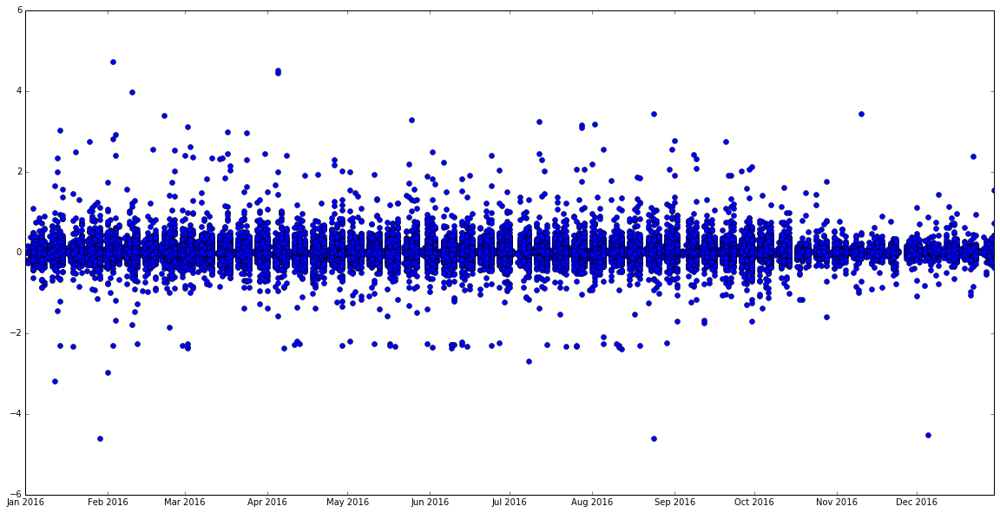

In [49]:
final_df['transactiondate']=pd.to_datetime(final_df['transactiondate'])
plt.figure(figsize=(20,10))
plt.plot_date(x=final_df['transactiondate'],y=final_df['logerror'])
plt.show()

In [50]:
train_data.describe()

,parcelid,logerror
count,9.027500e+04,90275.000000
mean,1.298466e+07,0.011457
std,2.504510e+06,0.161079
min,1.071174e+07,-4.605000
25%,1.155950e+07,-0.025300
50%,1.254734e+07,0.006000
75%,1.422755e+07,0.039200
max,1.629608e+08,4.737000


In [29]:
act_rows=final_df[final_df['transactiondate'] > '2016-09-30']

In [30]:
act_rows.describe()

,parcelid,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,finishedsquarefeet12,fips,fullbathcnt,heatingorsystemtypeid,...,roomcnt,unitcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,logerror
count,8.542000e+03,8542.000000,8542.000000,8542.000000,8542.000000,8542.000000,8542.000000,8542.000000,8542.000000,8542.000000,...,8542.000000,8542.000000,8542.000000,8.542000e+03,8.542000e+03,8542.0,8.542000e+03,8542.000000,8.542000e+03,8542.000000
mean,1.292633e+07,2.259951,3.022126,6.088621,2.281023,1748.752868,1707.439007,6048.417232,2.219621,3.198314,...,1.420979,1.074573,1967.717631,1.753421e+05,4.416947e+05,2015.0,2.664531e+05,5776.119705,6.048731e+13,0.016516
std,2.385718e+06,0.995160,1.128280,1.670698,0.967246,930.300065,884.323838,20.690659,0.953797,2.953015,...,2.776584,0.380643,23.730858,2.122343e+05,5.743787e+05,0.0,4.085389e+05,7602.653983,2.053507e+11,0.148484
min,1.071232e+07,0.000000,0.000000,1.000000,1.000000,160.000000,160.000000,6037.000000,1.000000,1.000000,...,0.000000,1.000000,1888.000000,1.460000e+02,7.704000e+03,2015.0,2.627000e+03,150.870000,6.037101e+13,-4.510000
25%,1.152467e+07,2.000000,2.000000,4.000000,2.000000,1170.000000,1172.000000,6037.000000,2.000000,2.000000,...,0.000000,1.000000,1952.000000,7.864400e+04,1.878305e+05,2015.0,7.410275e+04,2635.800000,6.037311e+13,-0.019200
50%,1.250748e+07,2.000000,3.000000,7.000000,2.000000,1514.000000,1533.000000,6037.000000,2.000000,2.000000,...,0.000000,1.000000,1968.000000,1.284185e+05,3.293240e+05,2015.0,1.793750e+05,4316.995000,6.037577e+13,0.010900
75%,1.416006e+07,3.000000,4.000000,7.000000,3.000000,2054.750000,1964.000000,6059.000000,3.000000,2.000000,...,0.000000,1.000000,1986.000000,2.021900e+05,5.126718e+05,2015.0,3.259755e+05,6599.017500,6.059042e+13,0.043100
max,1.629608e+08,15.000000,12.000000,12.000000,15.000000,20013.000000,20013.000000,6111.000000,15.000000,24.000000,...,13.000000,4.000000,2015.000000,5.355639e+06,2.241172e+07,2015.0,1.705608e+07,272407.030000,6.111009e+13,3.443000


In [34]:
test_set.count()

bathroomcnt                     2985342
bedroomcnt                      2985342
buildingqualitytypeid           2985342
calculatedbathnbr               2985342
calculatedfinishedsquarefeet    2985342
finishedsquarefeet12            2985342
fips                            2985342
fullbathcnt                     2985342
heatingorsystemtypeid           2985342
latitude                        2985342
longitude                       2985342
lotsizesquarefeet               2985342
propertylandusetypeid           2985342
rawcensustractandblock          2985342
regionidcity                    2985342
regionidcounty                  2985342
regionidzip                     2985342
roomcnt                         2985342
unitcnt                         2985342
yearbuilt                       2985342
structuretaxvaluedollarcnt      2985342
taxvaluedollarcnt               2985342
landtaxvaluedollarcnt           2985342
taxamount                       2985342
censustractandblock             2985342
